In [1]:
import copy

import matplotlib.pyplot as plt
import openpyxl
import os
import numpy as np
from xgraph.definitions import ROOT_DIR
from cilog import create_logger
from os.path import join as opj
import os.path as osp
import datetime
import matplotlib.ticker as mtick
import pandas as pd
from pathlib import Path

SMALL_SIZE = 16
MEDIUM_SIZE = 18
BIGGER_SIZE = 20

plt.rc('font', size=BIGGER_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=BIGGER_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=14)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

/data/shurui.gui/anaconda3/envs/torch_110/lib/python3.8/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [2]:
read_df = pd.read_excel(Path(ROOT_DIR, 'quantitative_results', 'GCN_GIN_PL.xlsx'), sheet_name=['GCN', 'GIN'], index_col=[0, 1], header=[0, 1])

read_df['GCN']

ba_infe                        ba_lrp            \
                             Accuracy Fidelity+ Fidelity- Fidelity+ Fidelity-   
0.50 DeepLIFT                  0.6025    0.9265   -0.0209    0.5174    0.1642   
     FlowMask                  0.9830    0.5226    0.1516    0.3416    0.5113   
     FlowX                     0.9230    0.9552   -0.0314    0.5167    0.1834   
     FlowX_minus               0.9139    0.9384   -0.0320    0.5145    0.0871   
     FlowX_plus                0.7845    0.9589   -0.0090    0.5148    0.2862   
...                               ...       ...       ...       ...       ...   
0.90 PGMExplainer              0.3612    0.5285    0.2081    0.0884    0.5110   
     RC_Explainer_Batch_star   0.0643    0.0310    0.3912    0.1116    0.5114   
     SubgraphX                    NaN       NaN       NaN       NaN       NaN   
     VGIB                      0.1995    0.2627    0.5145    0.4208    0.5106   
0.99 FlowX_plus                   NaN       NaN       NaN       NaN       NaN   

                             ba_shapes           ba_traffic            \
                             Fidelity+ Fidelity-   Accuracy Fidelity+   
0.50 DeepLIFT                   0.4610    0.3556     0.3061    0.4220   
     FlowMask                   0.4140    0.2695     0.8875    0.3148   
     FlowX                      0.4137    0.2077     0.8534    0.4223   
     FlowX_minus                0.4137    0.2069     0.8443    0.4131   
     FlowX_plus                 0.4137    0.2238     0.8205    0.4438   
...                                ...       ...        ...       ...   
0.90 PGMExplainer               0.2669    0.4143     0.2789    0.2193   
     RC_Explainer_Batch_star       NaN       NaN     0.3166    0.1984   
     SubgraphX                     NaN       NaN        NaN       NaN   
     VGIB                          NaN       NaN     0.2503    0.1000   
0.99 FlowX_plus                    NaN       NaN     0.8538    0.0000   

                                            bace                bbbp  \
                             Fidelity- Fidelity+ Fidelity- Fidelity+   
0.50 DeepLIFT                   0.0544    0.4679   -0.0794    0.5214   
     FlowMask                   0.1262    0.3246   -0.0053    0.5776   
     FlowX                      0.0108    0.5536   -0.1074    0.6273   
     FlowX_minus                0.0089    0.5054   -0.1281    0.5773   
     FlowX_plus                 0.0251    0.5964   -0.0841    0.7249   
...                                ...       ...       ...       ...   
0.90 PGMExplainer               0.2351    0.1663    0.1717    0.1557   
     RC_Explainer_Batch_star    0.2095    0.2057    0.2077    0.0956   
     SubgraphX                     NaN    0.2771    0.0214       NaN   
     VGIB                       0.2604    0.0800    0.2210    0.0580   
0.99 FlowX_plus                 0.2894       NaN       NaN       NaN   

                                         clintox           graph_sst2  \
                             Fidelity- Fidelity+ Fidelity-  Fidelity+   
0.50 DeepLIFT                  -0.0231    0.3752    0.0378     0.3833   
     FlowMask                   0.0467    0.3925    0.0697     0.3310   
     FlowX                     -0.0492    0.3990   -0.0008     0.4439   
     FlowX_minus               -0.0803    0.3731   -0.0105     0.4786   
     FlowX_plus                -0.0204    0.4234    0.0293     0.5462   
...                                ...       ...       ...        ...   
0.90 PGMExplainer               0.4459    0.1323    0.2250     0.0686   
     RC_Explainer_Batch_star    0.2881    0.1414    0.2979     0.0501   
     SubgraphX                     NaN       NaN       NaN        NaN   
     VGIB                       0.4568   -0.0068    0.2671     0.0167   
0.99 FlowX_plus                    NaN       NaN       NaN        NaN   

                                           tox21            
                             Fidelity- Fidelity+ Fidelity-  
0.50 DeepLIFT    

In [29]:
read_df['GCN'].loc[:, ('ba_infe', 'Accuracy')].loc[[0.5, 0.6, 0.7, 0.8, 0.9], 'GradCAM']

0.5  GradCAM    0.9025
0.6  GradCAM    0.8578
0.7  GradCAM    0.7852
0.8  GradCAM    0.6338
0.9  GradCAM    0.3781
Name: (ba_infe, Accuracy), dtype: float64

In [3]:
single_figure_setting = {'figsize': (4.4, 4), 'dpi': 300}
# use ordered dict
from collections import OrderedDict
explainer_meta = OrderedDict({
    'GradCAM': {'name': 'GradCAM', 'marker': '^--C0'},
    'DeepLIFT': {'name': 'DeepLIFT', 'marker': 'v--C1'},
    'GNNExplainer': {'name': 'GNNExplainer', 'marker': 's--C2'},
    'PGExplainer': {'name': 'PGExplainer', 'marker': 'p--C3'},
    'PGMExplainer': {'name': 'PGMExplainer', 'marker': 'o--C4'},
    'SubgraphX': {'name': 'SubgraphX', 'marker': 'D--C5'},
    'GNN_GI': {'name': 'GNN-GI', 'marker': '>--C6'},
    'GNN_LRP': {'name': 'GNN-LRP', 'marker': 'P--C7'},
    'RC_Explainer_Batch_star': {'name': 'RC-Explainer', 'marker': '8--C8'},
    'VGIB': {'name': 'VGIB', 'marker': '<--C9'},
    'FlowMask': {'name': 'FlowMask (Ours)', 'marker': 'H-C3'},
    'FlowX': {'name': 'FlowX (Ours)', 'marker': 'x-C0'},
    'FlowX_plus': {'name': r'FlowX$_{nec}$ (Ours)', 'marker': 'X-C1'},
    'FlowX_minus': {'name': r'FlowX$_{suf}$ (Ours)', 'marker': '*-C2'},
})
dataset_meta = {
    'ba_infe': 'BA-Infection',
    'ba_traffic': 'BA-Traffic',
    'ba_shapes': 'BA-Shapes',
    'ba_lrp': 'BA-LRP',
    'tox21': 'Tox21',
    'bbbp': 'BBBP',
    'bace': 'BACE',
    'clintox': 'ClinTox',
    'graph_sst2': 'Graph-SST2'
}
target_sparsity = [0.5, 0.6, 0.7, 0.8, 0.9]

In [72]:
list(explainer_meta.keys()).index('FlowX')

10

In [4]:
start_time = f'{datetime.datetime.now().strftime("%Y%m%d_%H_%M_%S")}'
legend_meta = copy.deepcopy(explainer_meta)
for gnn in ['GCN', 'GIN']:
    results_table = read_df[gnn]
    for dataset, metric in results_table.columns:
        fig, ax = plt.subplots(**single_figure_setting)
        single_fig_table = results_table.loc[:, (dataset, metric)]
        for explainer in single_fig_table.index.levels[1]:
            if explainer in explainer_meta.keys():
                if (explainer == 'SubgraphX' and metric == 'Fidelity-') or \
                    (explainer == 'FlowX_plus' and metric == 'Fidelity-') or \
                    (explainer == 'FlowX_minus' and metric == 'Fidelity+'):
                    continue
                legend_handle = ax.plot([1, 2, 3, 4, 5] if dataset == 'ba_traffic' and metric == 'Accuracy' else target_sparsity, single_fig_table.loc[target_sparsity, explainer], explainer_meta[explainer]['marker'], label=explainer_meta[explainer]['name'], linewidth=2, markerfacecolor='white', markersize=12, zorder=list(explainer_meta.keys()).index(explainer))
                if legend_meta[explainer].get('handle') is None:
                    legend_meta[explainer]['handle'] = legend_handle[0]
        if dataset == 'ba_traffic' and metric == 'Accuracy':
            ax.set_xlabel('Runs')
            ax.set_ylabel('Full recall sparsity')
        else:
            ax.set_xlabel('Sparsity')
            ax.set_ylabel(metric)
        ax.set_title(f'{dataset_meta[dataset]} ({gnn})')
        ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.2f'))
        plt.subplots_adjust(left=0.23, bottom=0.155, right=0.99, top=0.92, wspace=.001, hspace=.001)
        # plt.show()
        saving_root = Path(ROOT_DIR) / 'quantitative_results' / 'plots' / start_time / metric
        os.makedirs(saving_root, exist_ok=True)
        fig.savefig(opj(saving_root, f'{gnn}_{dataset}.pdf'), format='pdf')
        plt.close(fig)

In [5]:
legend_fig, ax = plt.subplots(**single_figure_setting)
ax.axis('off')
# print(handles)
legend = ax.legend([meta['handle'] for meta in legend_meta.values()], [meta['name'] for meta in legend_meta.values()], loc=3, framealpha=1, frameon=False)
plt.subplots_adjust(left=0.21, bottom=-0.025, right=0.99, top=0.74, wspace=.001, hspace=.001)
legend_fig.savefig(opj(saving_root, 'legend1.pdf'), format='pdf')
plt.close(legend_fig)

In [6]:
legend_fig, ax = plt.subplots(**single_figure_setting)
ax.axis('off')
# print(handles)
legend_meta_copy = copy.deepcopy(legend_meta)
legend_meta_copy.pop('SubgraphX')
legend = ax.legend([meta['handle'] for meta in legend_meta_copy.values()], [meta['name'] for meta in legend_meta_copy.values()], loc=3, framealpha=1, frameon=False)
plt.subplots_adjust(left=0.21, bottom=-0.025, right=0.99, top=0.74, wspace=.001, hspace=.001)
legend_fig.savefig(opj(saving_root, 'legend2.pdf'), format='pdf')
plt.close(legend_fig)

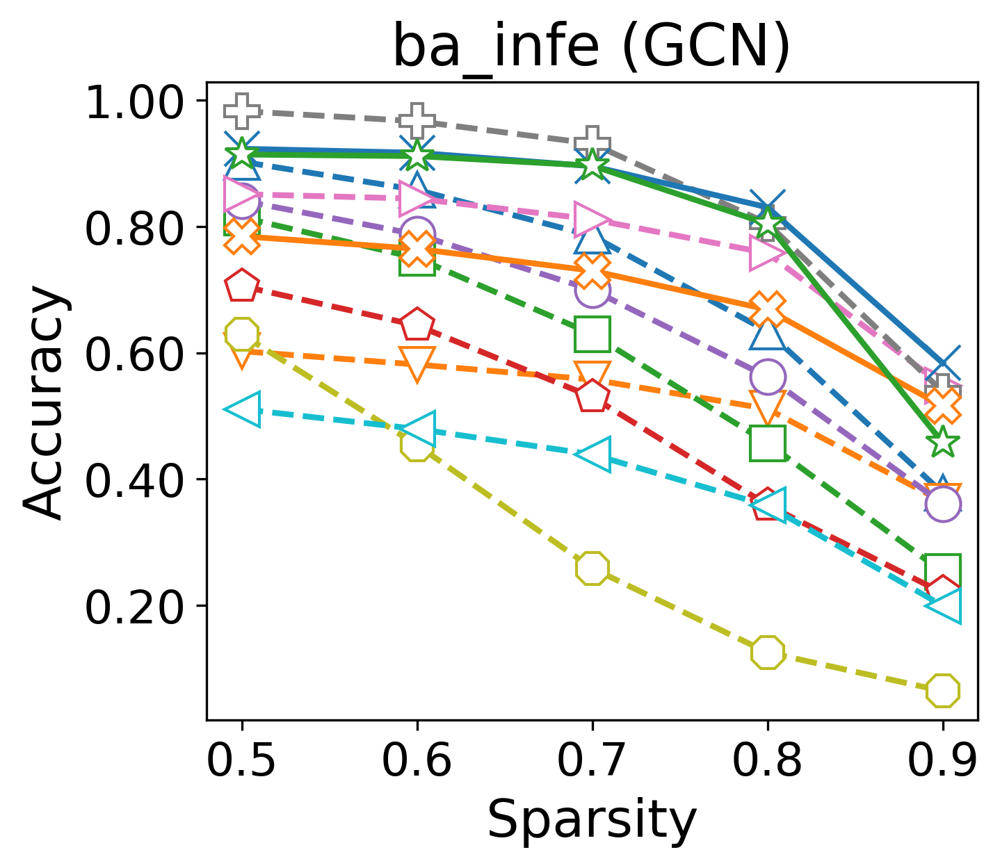

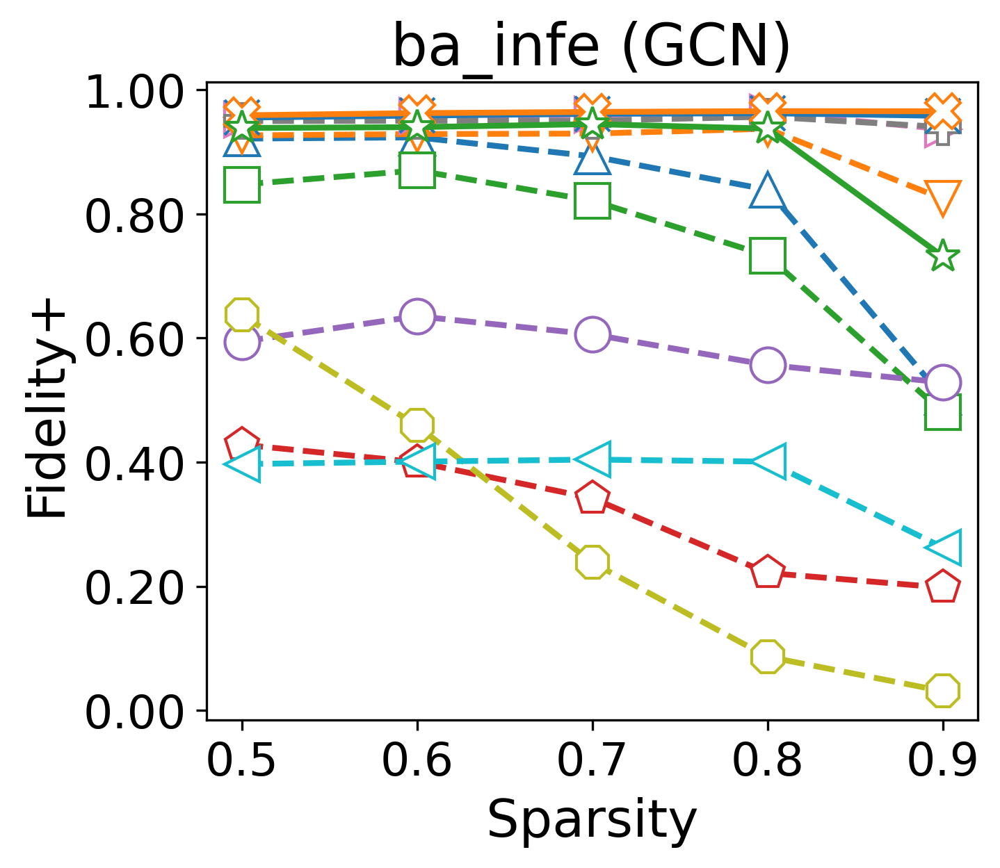

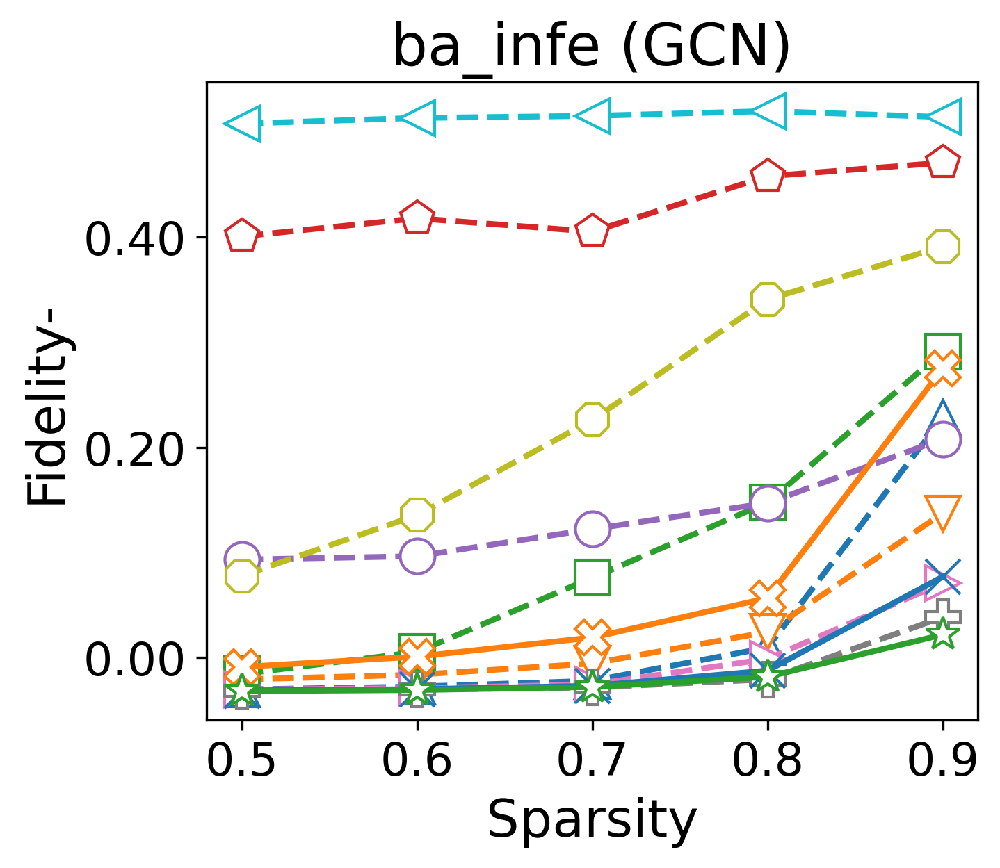

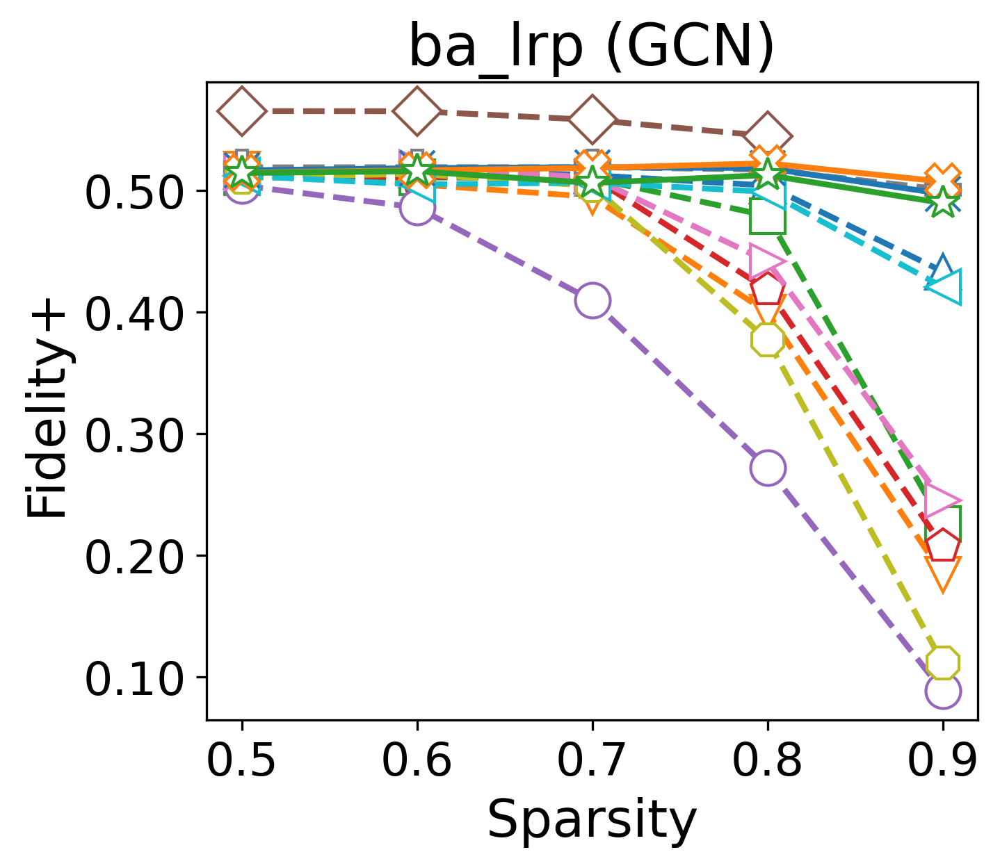

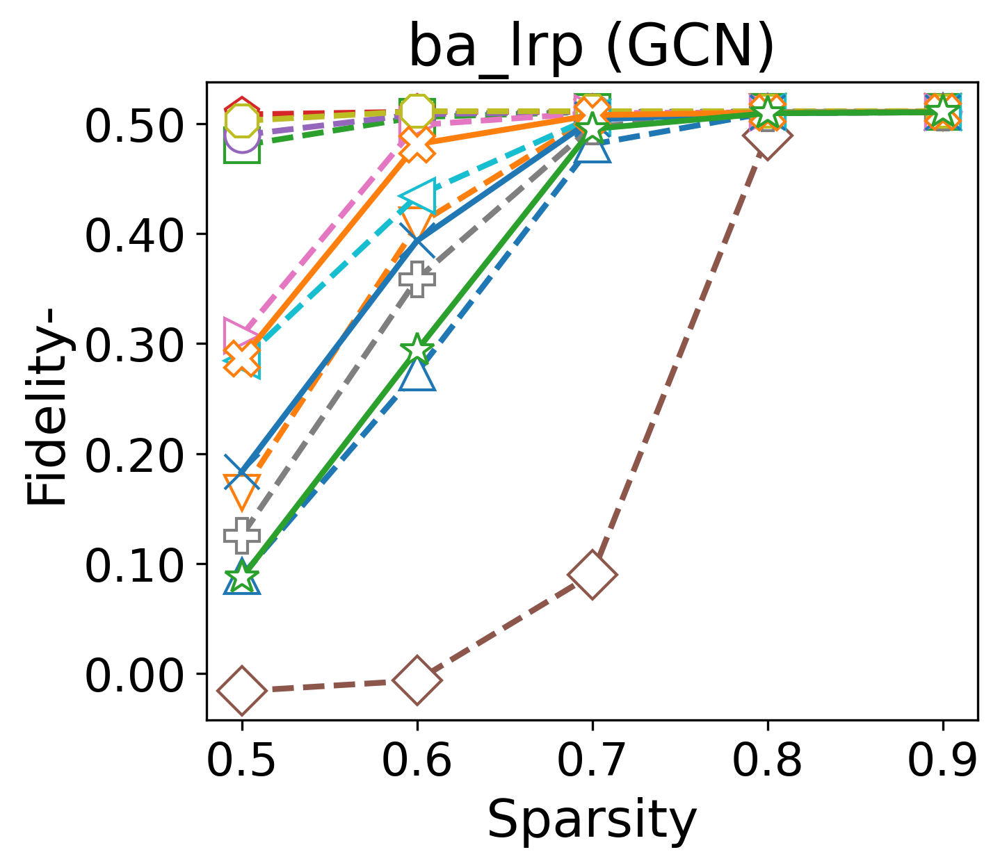

...

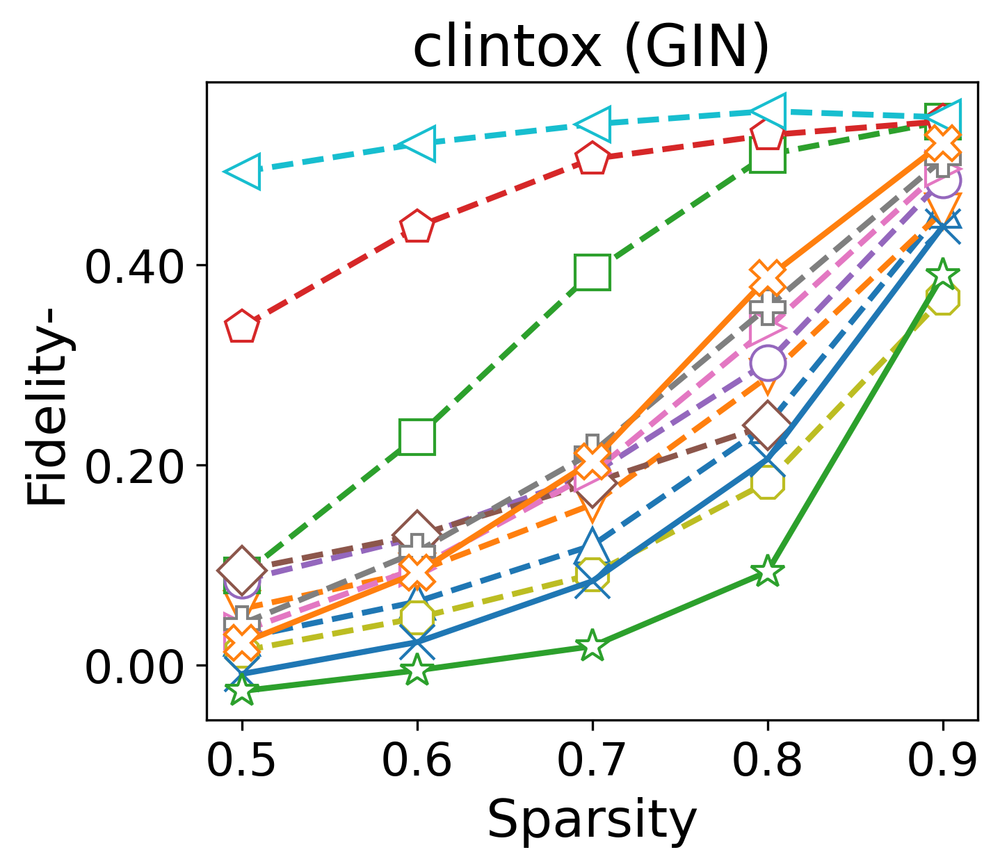

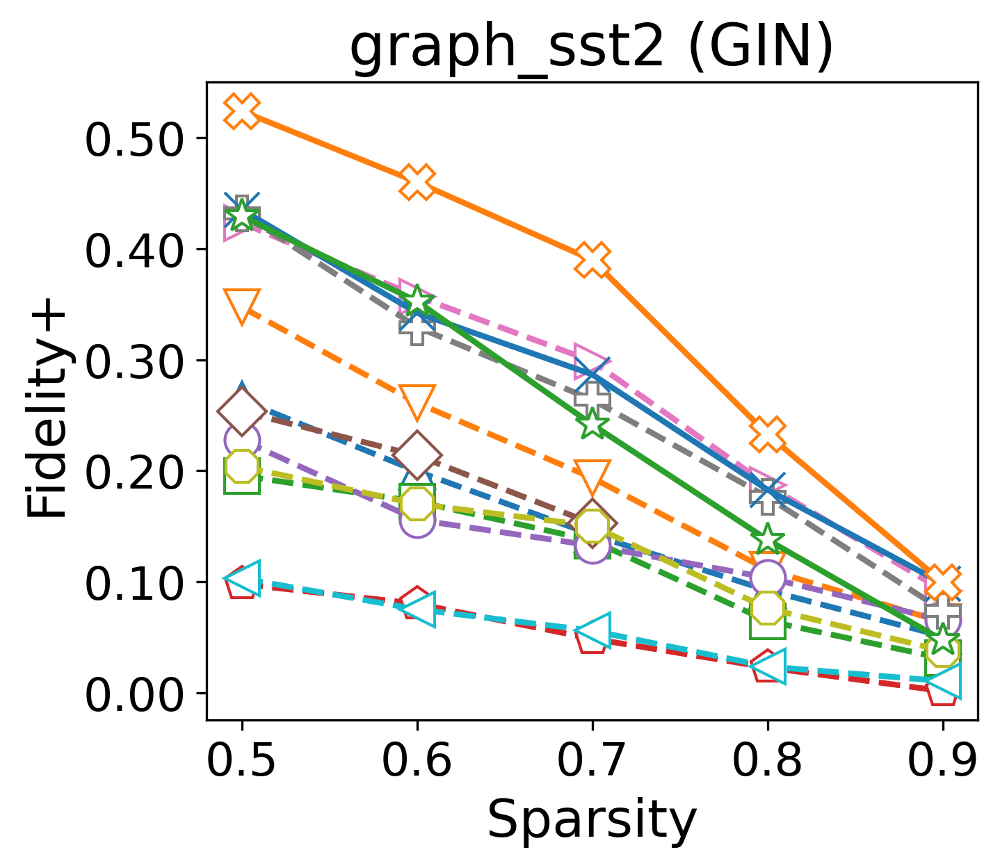

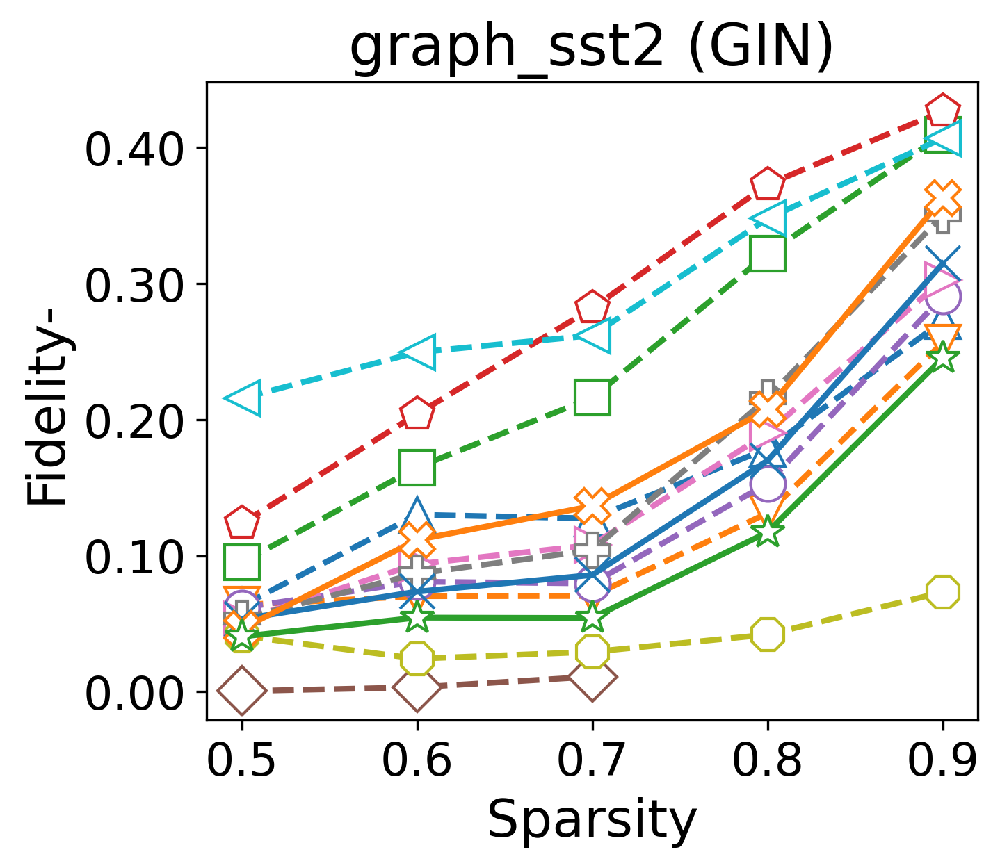

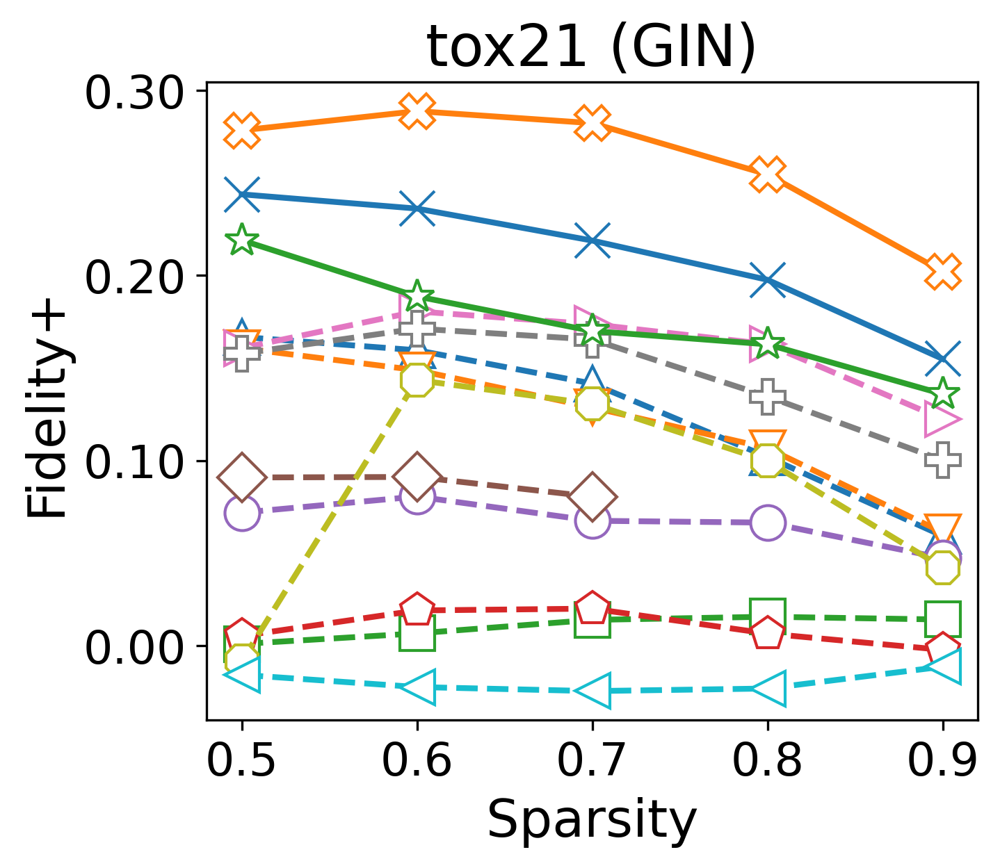

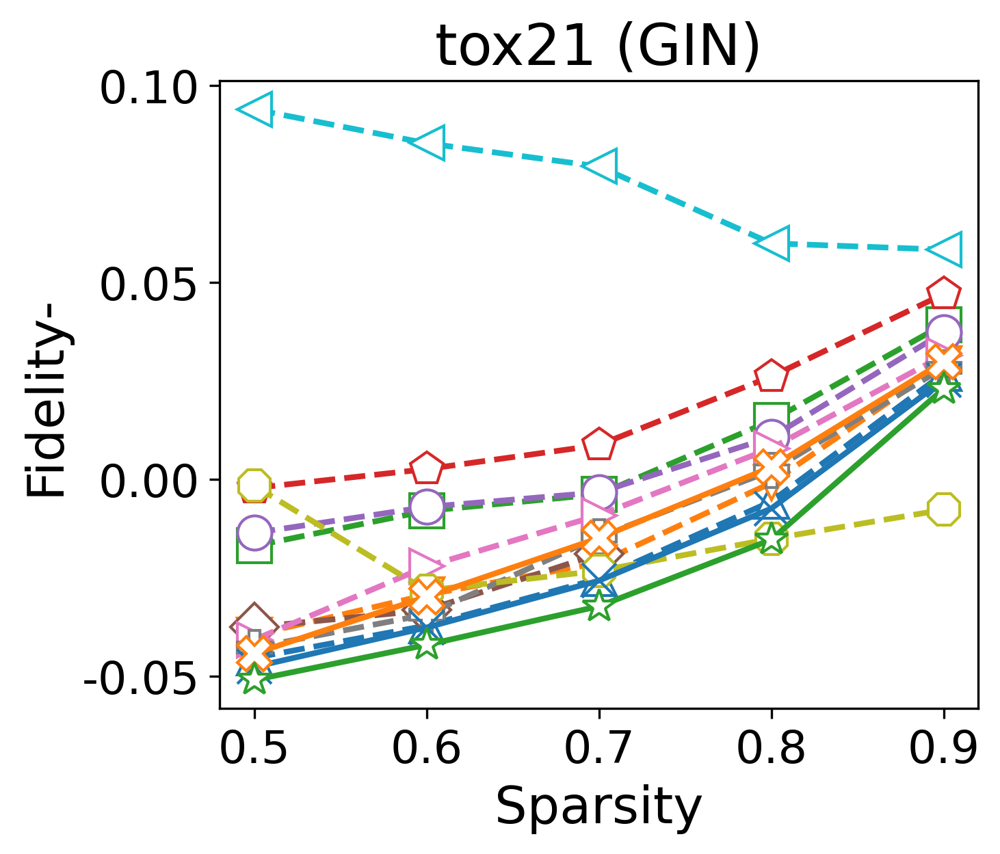

In [73]:
start_time = f'{datetime.datetime.now().strftime("%Y%m%d_%H_%M_%S")}'
for gnn in ['GCN', 'GIN']:
    results_table = read_df[gnn]
    for dataset, metric in results_table.columns:
        fig, ax = plt.subplots(**single_figure_setting)
        single_fig_table = results_table.loc[:, (dataset, metric)]
        for explainer in single_fig_table.index.levels[1]:
            if explainer in explainer_meta.keys():
                ax.plot(target_sparsity, single_fig_table.loc[target_sparsity, explainer], explainer_meta[explainer]['marker'], label=explainer_meta[explainer]['name'], linewidth=2, markerfacecolor='white', markersize=12, zorder=list(explainer_meta.keys()).index(explainer))
        ax.set_xlabel('Sparsity')
        ax.set_ylabel(metric)
        ax.set_title(f'{dataset} ({gnn})')
        ax.yaxis.set_major_formatter(mtick.FormatStrFormatter('%.2f'))
        plt.subplots_adjust(left=0.15, bottom=0.155, right=0.99, top=0.92, wspace=.001, hspace=.001)
        plt.show()